# Импорт библиотек

In [ ]:
! pip install zipfile-deflate64
! pip install exif
! pip install haversine

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 43 kB 1.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 93 kB 1.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import zipfile_deflate64 as zipfile
import exif
import pandas as pd
import math

from os import listdir
from os.path import join
from haversine import haversine
from math import asin, atan2, sin, cos

# Ознакомление с набором данных

In [ ]:
dataset_path = "/content/drive/MyDrive/Копия Визуальные_термо.zip"
dataset_folder = "images"

In [ ]:
if not os.path.exists(dataset_folder):
  os.mkdir(dataset_folder)

In [ ]:
if len(listdir(dataset_folder)) == 0:
  with zipfile.ZipFile(dataset_path) as archive:
    archive.extractall(dataset_folder)

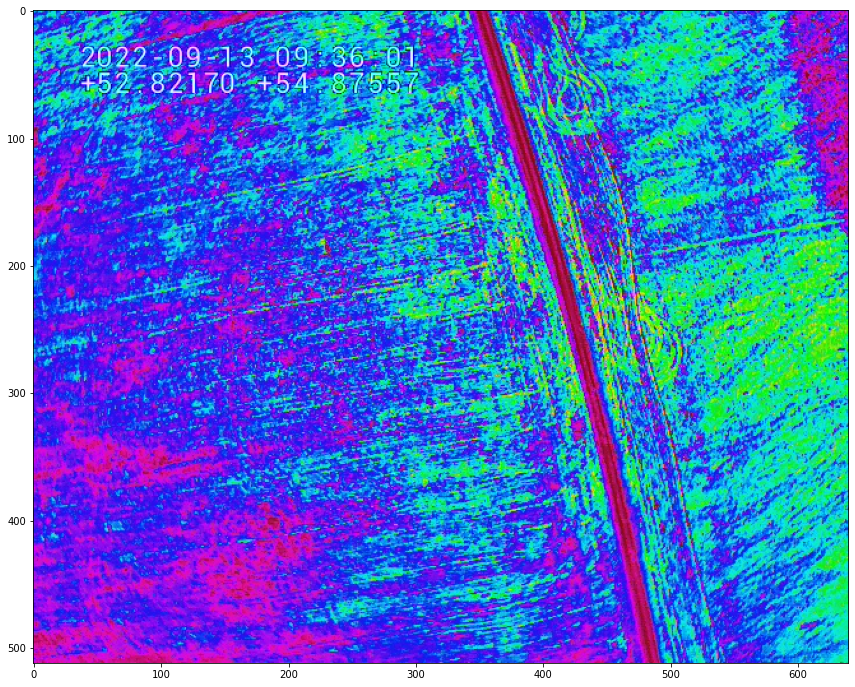

In [ ]:
def img_get(number_image):
  """
  Function get number of image and return that image as numpy array
  """
  return cv2.cvtColor(cv2.imread(join(dataset_folder, listdir(dataset_folder)[number_image])), cv2.COLOR_BGR2RGB)

def img_show(number_image, width=15, height=12):
  """
  Get number of image and show it
  """
  plt.figure(figsize=(width, height))
  plt.imshow(img_get(number_image));

img_show(0)

Получаем метаданные из изображений

In [ ]:
def get_metadata(img_path):
  img = exif.Image(img_path)

  # gps
  longitude = img.gps_longitude
  latitude = img.gps_latitude
  altitude = img.gps_altitude
  
  # image info
  width = img.pixel_x_dimension
  height = img.pixel_y_dimension

  # time info
  datetime = img.datetime.split()

  # convert coordinates to grad
  longitude = longitude[0] + (longitude[1] / 60) + (longitude[2] / 3600)
  latitude = latitude[0] + (latitude[1] / 60) + (latitude[2] / 3600)

  return (latitude, longitude, altitude), (width, height), (datetime[0], datetime[1])

maps_dict = {"image_name": [],"latitude": [], "longitude": [], "altitude": [], "date": [], "time": []}
t_maps_dict = {"image_name": [],"latitude": [], "longitude": [], "altitude": [], "date": [], "time": []}

for i in listdir(dataset_folder):
  img = join(dataset_folder, i)
  
  (lat, lon, alt), (w, h), (d, t) = get_metadata(img)

  # split to simple maps and temperature maps
  if w == 8000 and h == 6000:
    maps_dict["image_name"].append(i)
    maps_dict["latitude"].append(lat)
    maps_dict["longitude"].append(lon)
    maps_dict["altitude"].append(alt)
    maps_dict["date"].append(d)
    maps_dict["time"].append(t)
  elif w == 640 and h == 512:
    t_maps_dict["image_name"].append(i)
    t_maps_dict["latitude"].append(lat)
    t_maps_dict["longitude"].append(lon)
    t_maps_dict["altitude"].append(alt)
    t_maps_dict["date"].append(d)
    t_maps_dict["time"].append(t)

maps_df = pd.DataFrame(data=maps_dict)
t_maps_df = pd.DataFrame(data=t_maps_dict)

In [ ]:
maps_df.head(5)

,image_name,latitude,longitude,altitude,date,time
0,DJI_0085_W.JPG,54.867205,52.831017,468.146,2022:09:13,09:34:34
1,DJI_0057_W.JPG,54.863514,52.834199,468.163,2022:09:13,09:33:25
2,DJI_0267_W.JPG,54.868885,52.833717,468.216,2022:09:13,09:42:03
3,DJI_0219_W.JPG,54.873486,52.826061,468.103,2022:09:13,09:40:01
4,DJI_0027_W.JPG,54.870689,52.824813,468.039,2022:09:13,09:32:10


In [ ]:
t_maps_df.head(5)

,image_name,latitude,longitude,altitude,date,time
0,DJI_0124_T.JPG,54.875566,52.821696,468.274,2022:09:13,09:36:01
1,DJI_0156_T.JPG,54.867832,52.831816,468.179,2022:09:13,09:37:28
2,DJI_0360_T.JPG,54.874168,52.830068,468.245,2022:09:13,09:45:50
3,DJI_0214_T.JPG,54.872095,52.827881,468.191,2022:09:13,09:39:48
4,DJI_0342_T.JPG,54.877099,52.824621,468.101,2022:09:13,09:45:02


Проверим все ли картинки в наших датасетах

In [ ]:
assert len(maps_df) + len(t_maps_df) == len(listdir(dataset_folder))

# Анализ

Все ли снимки были сделаны в один день?

In [ ]:
maps_df["date"].unique()

array(['2022:09:13'], dtype=object)

В течении какого промежутка времени проводилось иследование?

In [ ]:
maps_df["time"].min()

'09:31:34'

In [ ]:
maps_df["time"].max()

'09:46:14'

В течении 15 минут

## Отобразим путь квадркоптера

Сначала выведем точки фоток в 2 измерениях



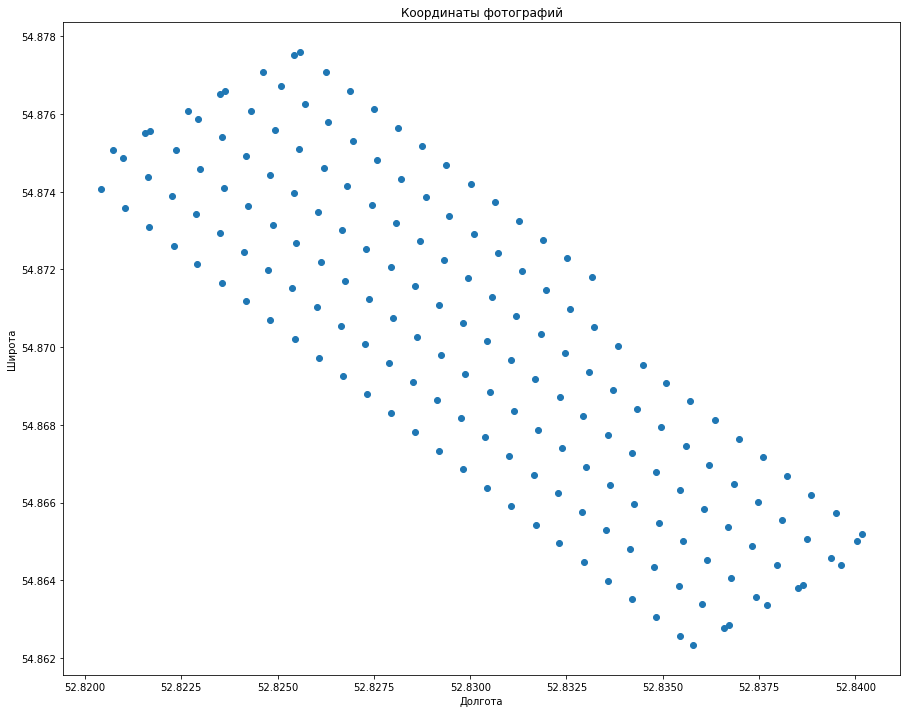

In [ ]:
plt.figure(figsize=(15, 12))

plt.title("Координаты фотографий")
plt.xlabel("Долгота")
plt.ylabel("Широта")
plt.scatter(maps_df["longitude"], maps_df["latitude"]);

Теперь посмотрим на траекторию квадракоптера.

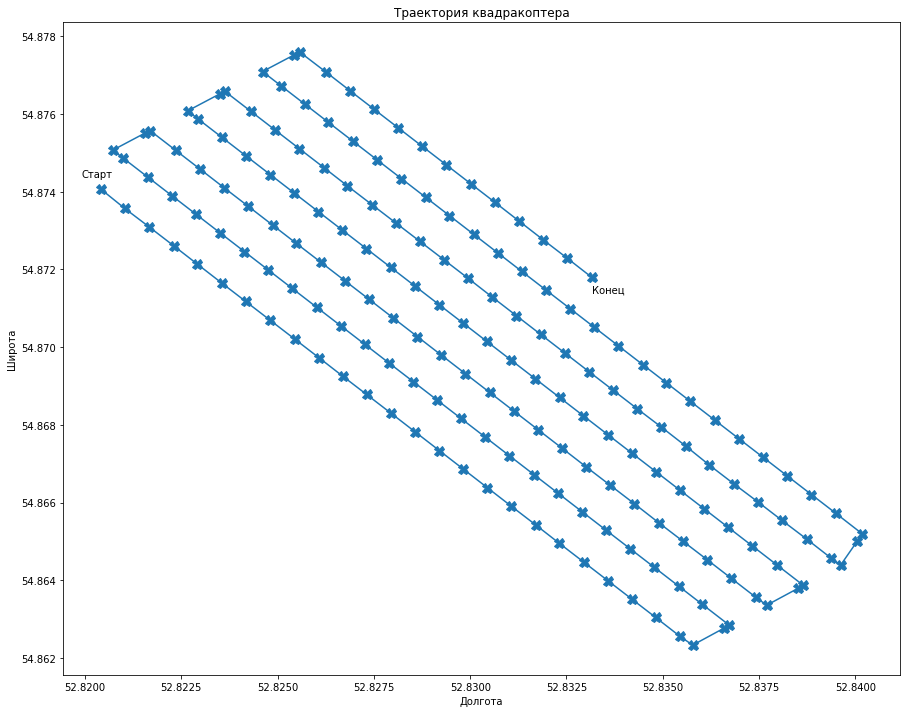

In [ ]:
plt.figure(figsize=(15, 12))
sorted_maps_df = maps_df.sort_values(by="time").reset_index()

plt.title("Траектория квадракоптера")
plt.xlabel("Долгота")
plt.ylabel("Широта")

# Make start and end text labels
plt.text(sorted_maps_df.iloc[0].longitude - 0.0005, sorted_maps_df.iloc[0].latitude + 0.0003, "Старт")
plt.text(sorted_maps_df.iloc[-1].longitude, sorted_maps_df.iloc[-1].latitude - 0.0004, "Конец")

plt.plot(sorted_maps_df["longitude"], sorted_maps_df["latitude"], marker="X", markersize=10);

Проверим дисперсию высоты.

In [ ]:
sorted_maps_df["altitude"].var()

0.0177292134831457

Снимки были сделанны на одной высоте. Выходит нет нужды строить 3д траекторию.

Фотографии были сделанны примерно через равные растояния, специально для удобного анализа. Стоит найти среднее растояние между фотографиями, что бы вычислить примерный размер фотографий в реальных метрах.

In [ ]:
a = (sorted_maps_df.iloc[0].latitude, sorted_maps_df.iloc[0].longitude)
b = (sorted_maps_df.iloc[1].latitude, sorted_maps_df.iloc[1].longitude)
haversine(a, b) * 1000

67.40300380992899

Спешу предположить, что дрон делает фотки примерно через 60 - 70 метров.

Но для начала подсчитаем среднее растояние между фотографиями, без учетов выбросов.

In [ ]:
sum = 0
count = 0

for i, raw in sorted_maps_df.iterrows():
  try:
    d = haversine((raw.latitude, raw.longitude), (sorted_maps_df.iloc[i+1].latitude, sorted_maps_df.iloc[i+1].longitude)) * 1000
    if d > 50:
      sum += d
      count += 1
    else:
      print("Выброс (не учитываем):", d)
  except IndexError:
    pass

print("Среднее растояние между фотографиями (без учёта выбросов):", sum / count)

Выброс (не учитываем): 33.34283098863495
Выброс (не учитываем): 11.285400964961601
Выброс (не учитываем): 29.38320816373207
Выброс (не учитываем): 11.369767085262472
Выброс (не учитываем): 29.54203856370735
Выброс (не учитываем): 11.980613642189319
Выброс (не учитываем): 27.543171555816418
Выброс (не учитываем): 11.823825438154145
Выброс (не учитываем): 27.21234621487085
Выброс (не учитываем): 23.627864710356956
Выброс (не учитываем): 12.141815752072295
Среднее растояние между фотографиями (без учёта выбросов): 66.95342763527289


Так как фотографии были сделанны на одной высоте, то можно вычислить какое количество пикселей отвечает за определенное растояние.

Росмотрим первую фотографию. На ней вы можете видеть нефтяную скважину. Посмотрим как эта скважина изменит своё местоположение на следующем кадре.

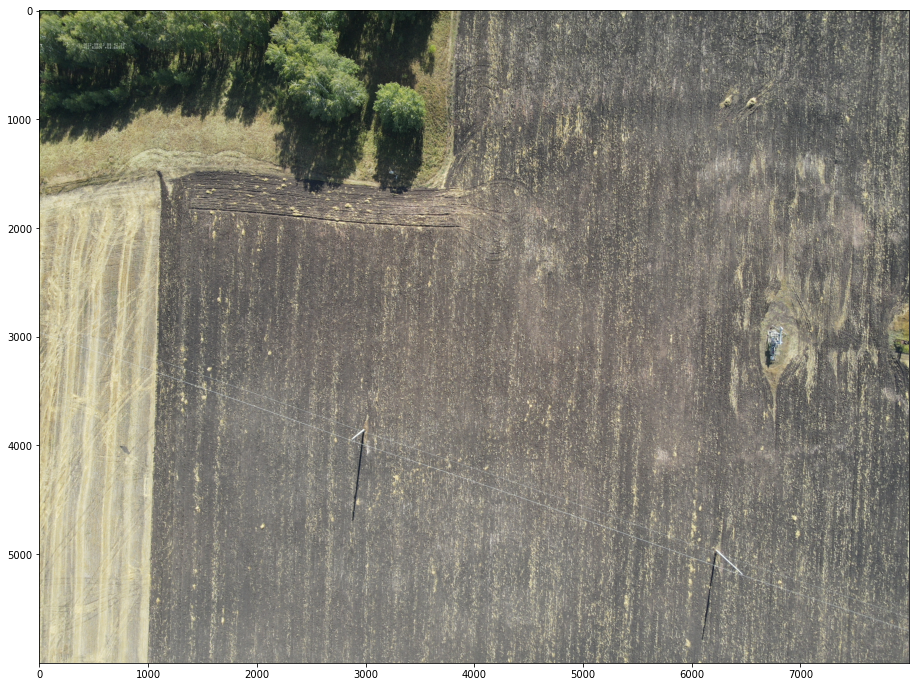

In [ ]:
plt.figure(figsize=(16, 12))
plt.imshow(cv2.cvtColor(cv2.imread(join(dataset_folder, "DJI_0281_W.JPG")), cv2.COLOR_BGR2RGB));

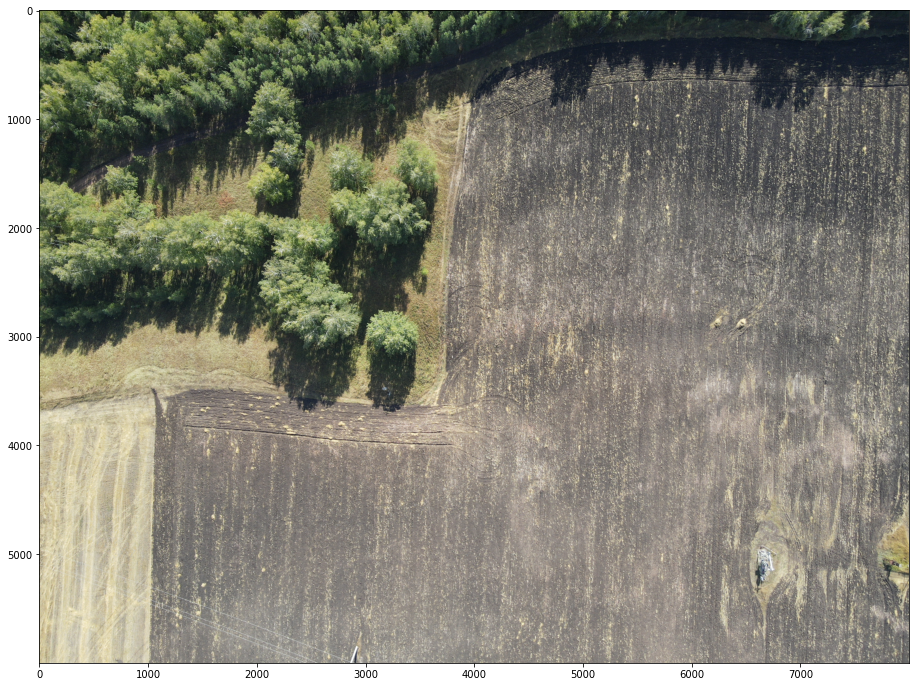

In [ ]:
plt.figure(figsize=(16, 12))
plt.imshow(cv2.cvtColor(cv2.imread(join(dataset_folder, "DJI_0283_W.JPG")), cv2.COLOR_BGR2RGB));

Посмотрим на сколько метров изменилось положение дрона.

In [ ]:
a = (sorted_maps_df.loc[134].latitude, sorted_maps_df.loc[134].longitude)
b = (sorted_maps_df.loc[135].latitude, sorted_maps_df.loc[135].longitude)

distance_a_b = haversine(a, b) * 1000

На 67 метров. Теперь узнаем насколько пикселей сдвинулся объект.

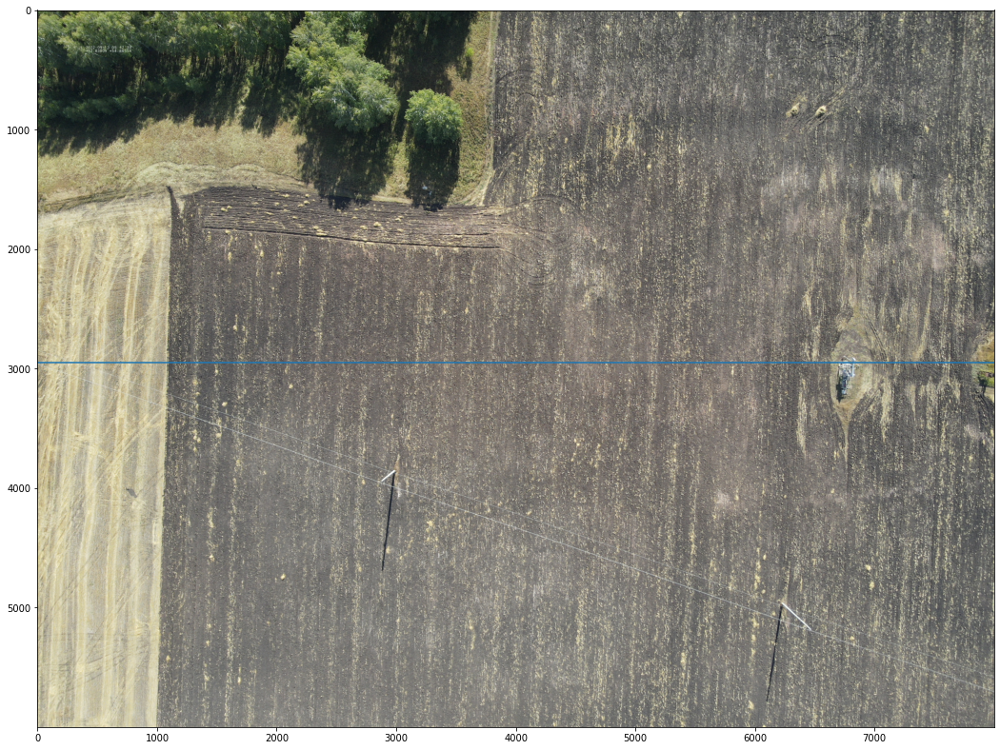

In [ ]:
def get_image_by_name(name):
  plt.figure(figsize=(18, 15))
  plt.imshow(cv2.cvtColor(cv2.imread(join(dataset_folder, name)), cv2.COLOR_BGR2RGB));

get_image_by_name(sorted_maps_df.loc[134].image_name)
plt.plot(np.arange(0, 8000, 1), np.array([2950 for _ in range(8000)]));

Примерно на 2900 пикселе находится верхняя часть скважины.

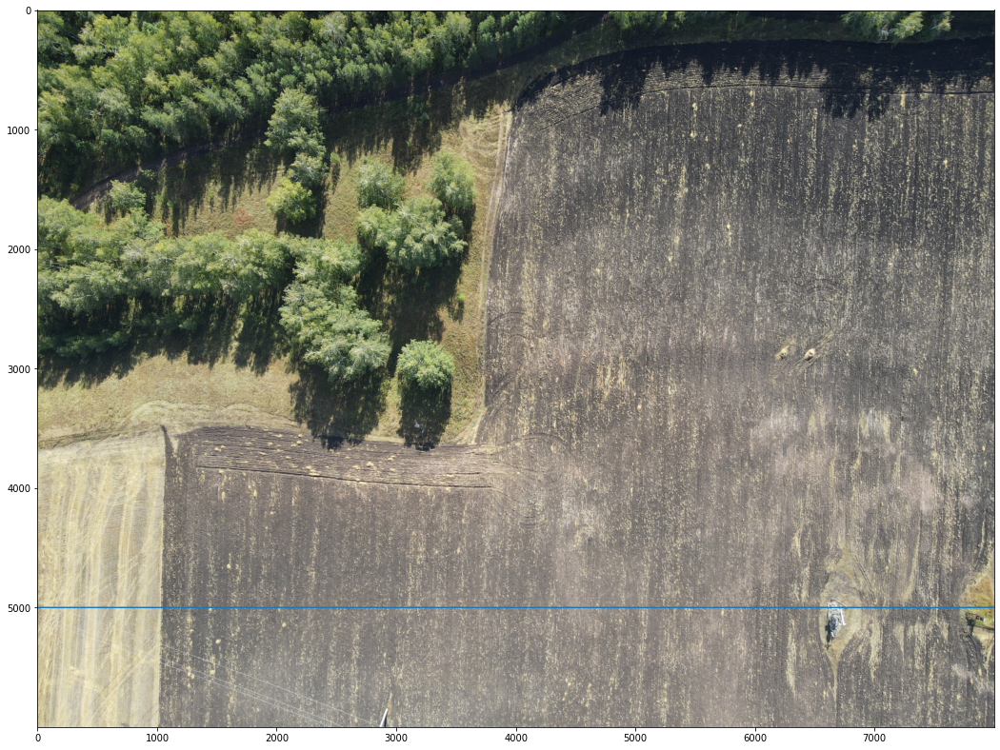

In [ ]:
get_image_by_name(sorted_maps_df.loc[135].image_name)
plt.plot(np.arange(0, 8000, 1), np.array([5000 for _ in range(8000)]));

Теперь найдем сколько пикселей приходится на 1 метр.

In [ ]:
pixels_per_metr = (-1 * (2950 - 5000)) / distance_a_b
pixels_per_metr

30.28122239064194

In [ ]:
pixels_per_metr = 24.67

Выходит на 1 метр приходится 30 пикселей.

## Проверка растояния

Измерим размер какого-нибудь объекта на фото оценим его размер, потом сравним с яндекс картами.

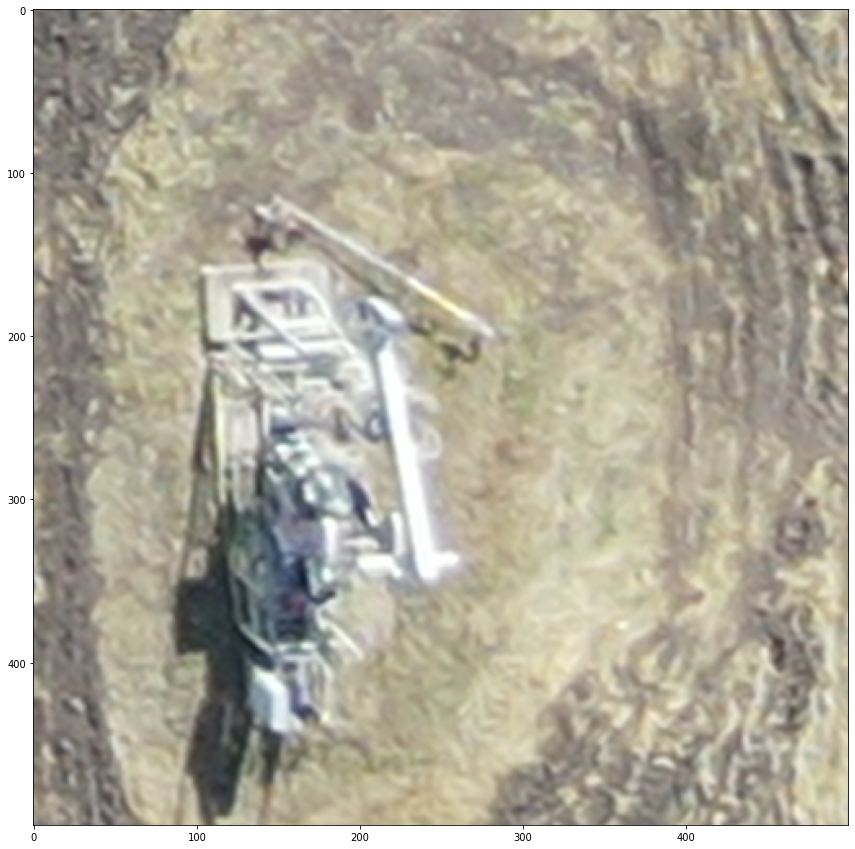

In [ ]:
plt.figure(figsize=(18, 15))
img = cv2.cvtColor(cv2.imread(join(dataset_folder, sorted_maps_df.loc[135].image_name)), cv2.COLOR_BGR2RGB)

width, height = 500, 500
x, y = 6500, 4800

crop_img = img[y:y+height, x:x+width]
plt.imshow(crop_img);

По фотографии видно что вышка примерно 100 пикселей (3 метра). Теперь посмотрим на яндекс карты.



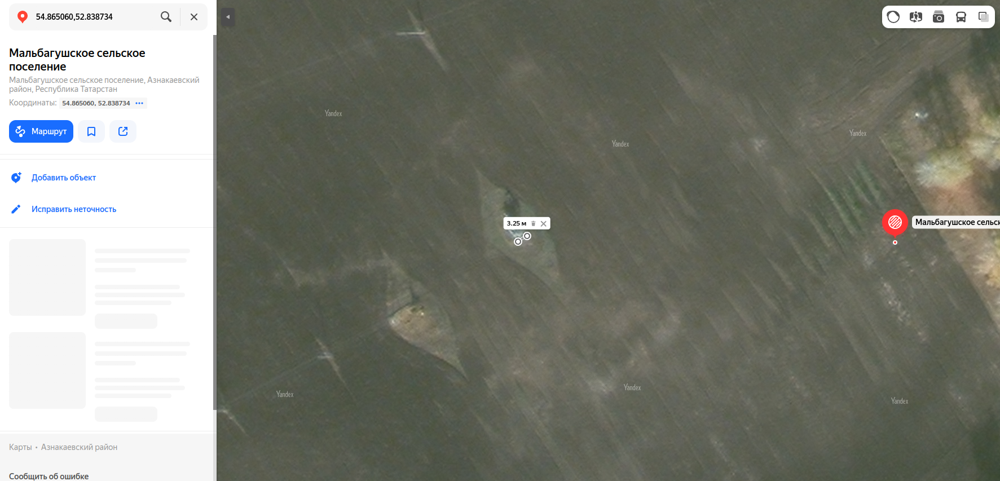

Считаю неплохой резельтат.

# Построение карты

Все наши изображения есть прямоугольник. Размером (в метрах).

In [ ]:
img_m_size = (8000 / pixels_per_metr, 6000 / pixels_per_metr)
img_m_size

(324.28050263477905, 243.2103769760843)

Работает

In [ ]:
def append_distance_to_coordinates(lat1, lon1, brng, d):
  """
  lat1: широта
  long1: долгота
  brng: направление движения (относительно севера)
  d: пройденная дистанция (в км)
  """
  
  R = 6371
  lat1 = math.radians(lat1)
  lon1 = math.radians(lon1)
  brng = math.radians(brng)

  lat2 = math.asin( math.sin(lat1)*math.cos(d/R) +
     math.cos(lat1)*math.sin(d/R)*math.cos(brng))

  lon2 = lon1 + math.atan2(math.sin(brng)*math.sin(d/R)*math.cos(lat1),
             math.cos(d/R)-math.sin(lat1)*math.sin(lat2))

  lat2 = math.degrees(lat2)
  lon2 = math.degrees(lon2)
  return (lat2, lon2)

# Продвигаемся 200 метров на север
append_distance_to_coordinates(sorted_maps_df.iloc[0].latitude, sorted_maps_df.iloc[0].longitude, 0, 200 / 1000)

(54.87586011543406, 52.82041927777778)

Построим прямоугольник из координат.

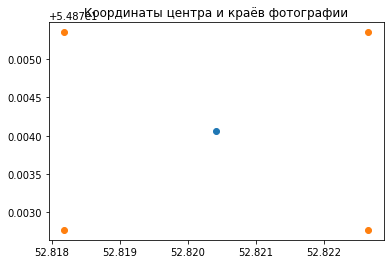

In [ ]:
plt.title("Координаты центра и краёв фотографии")

rectangle = []
distance = math.sqrt((img_m_size[0] / 2)**2 + (img_m_size[1] / 2)**2)

for b in [45, -45, 135, -135]:
  la = sorted_maps_df.iloc[0].latitude
  lo = sorted_maps_df.iloc[0].longitude
  rectangle.append(append_distance_to_coordinates(la, lo, b, distance / 1000))
rectangle = np.array(rectangle)

plt.scatter(sorted_maps_df.iloc[0].longitude, sorted_maps_df.iloc[0].latitude)
plt.scatter(rectangle[:, 1], rectangle[:, 0]);

Теперь нам изместны края фотографий. Теперь мы можем примерно определить положение классифицированного объекта на карте.

In [ ]:
rectangle

array([[54.8753503 , 52.82265936],
       [54.8753503 , 52.8181792 ],
       [54.87277261, 52.82265921],
       [54.87277261, 52.81817934]])

Теперь добавим координаты краёв фотографий.

In [ ]:
sorted_maps_df.drop("index", axis=1, inplace=True)

In [ ]:
left_top = []
right_top = []
left_bottom = []
right_bottom = []

for _, row in sorted_maps_df.iterrows():
  right_top.append(append_distance_to_coordinates(row.latitude, row.longitude, 45, distance / 1000))
  left_top.append(append_distance_to_coordinates(row.latitude, row.longitude, -45, distance / 1000))
  right_bottom.append(append_distance_to_coordinates(row.latitude, row.longitude, 135, distance / 1000))
  left_bottom.append(append_distance_to_coordinates(row.latitude, row.longitude, -135, distance / 1000))

sorted_maps_df["left_top"] = left_top
sorted_maps_df["right_top"] = right_top
sorted_maps_df["left_bottom"] = left_bottom
sorted_maps_df["right_bottom"] = right_bottom

Покажем найденные координаты.

In [ ]:
sorted_maps_df.head(5)

,image_name,latitude,longitude,altitude,date,time,left_top,right_top,left_bottom,right_bottom
0,DJI_0013_W.JPG,54.874061,52.820419,467.419,2022:09:13,09:31:34,"(54.875350297189115, 52.818179198720536)","(54.875350297189115, 52.82265935683503)","(54.87277260604346, 52.81817934197257)","(54.87277260604346, 52.822659213582995)"
1,DJI_0015_W.JPG,54.873569,52.821034,467.665,2022:09:13,09:31:39,"(54.87485821385614, 52.81879442051366)","(54.87485821385614, 52.82327452393078)","(54.8722805227105, 52.818794563761344)","(54.8722805227105, 52.8232743806831)"
2,DJI_0017_W.JPG,54.873099,52.821660,467.881,2022:09:13,09:31:44,"(54.874387880523194, 52.81942039109722)","(54.874387880523194, 52.823900442236116)","(54.87181018937753, 52.81942053434072)","(54.87181018937753, 52.823900298992605)"
3,DJI_0019_W.JPG,54.872611,52.822300,467.903,2022:09:13,09:31:50,"(54.873900269412445, 52.82005989041798)","(54.873900269412445, 52.824539887359805)","(54.87132257826679, 52.820060033657164)","(54.87132257826679, 52.82453974412063)"
4,DJI_0021_W.JPG,54.872136,52.822917,467.826,2022:09:13,09:31:55,"(54.87342513052393, 52.82067686126704)","(54.87342513052393, 52.825156805399644)","(54.870847439378274, 52.82067700450201)","(54.870847439378274, 52.82515666216467)"


Теперь у нас есть координаты углов каждой фотографии. Покажем эти границы на траектории.

In [ ]:
sorted_maps_df[["left_top", "right_top", "left_bottom", "right_bottom"]]

,left_top,right_top,left_bottom,right_bottom
0,"(54.875350297189115, 52.818179198720536)","(54.875350297189115, 52.82265935683503)","(54.87277260604346, 52.81817934197257)","(54.87277260604346, 52.822659213582995)"
1,"(54.87485821385614, 52.81879442051366)","(54.87485821385614, 52.82327452393078)","(54.8722805227105, 52.818794563761344)","(54.8722805227105, 52.8232743806831)"
2,"(54.874387880523194, 52.81942039109722)","(54.874387880523194, 52.823900442236116)","(54.87181018937753, 52.81942053434072)","(54.87181018937753, 52.823900298992605)"
3,"(54.873900269412445, 52.82005989041798)","(54.873900269412445, 52.824539887359805)","(54.87132257826679, 52.820060033657164)","(54.87132257826679, 52.82453974412063)"
4,"(54.87342513052393, 52.82067686126704)","(54.87342513052393, 52.825156805399644)","(54.870847439378274, 52.82067700450201)","(54.870847439378274, 52.82515666216467)"
...,...,...,...,...
174,"(54.875024769411596, 52.82839113347927)","(54.875024769411596, 52.83287125540963)","(54.872447078265935, 52.828391276728425)","(54.872447078265935, 52.832871112160475)"
175,"(54.874530158300836, 52.82903132763456)","(54.874530158300836, 52.833511394587674)","(54.87195246715519, 52.829031470879336)","(54.87195246715519, 52.8335112513429)"
176,"(54.87405638052343, 52.82964924285345)","(54.87405638052343, 52.83412925714656)","(54.87147868937778, 52.82964938609402)","(54.87147868937778, 52.834129113905995)"
177,"(54.87357435274602, 52.830283852974475)","(54.87357435274602, 52.83476381369219)","(54.870996661600365, 52.83028399621077)","(54.870996661600365, 52.83476367045589)"


Построим траеторию с учётом рамками фотографии. Эти точки будут показывать края наших фотографий. В пределах этих точек мы будем видеть наши обнаруженные объекты.

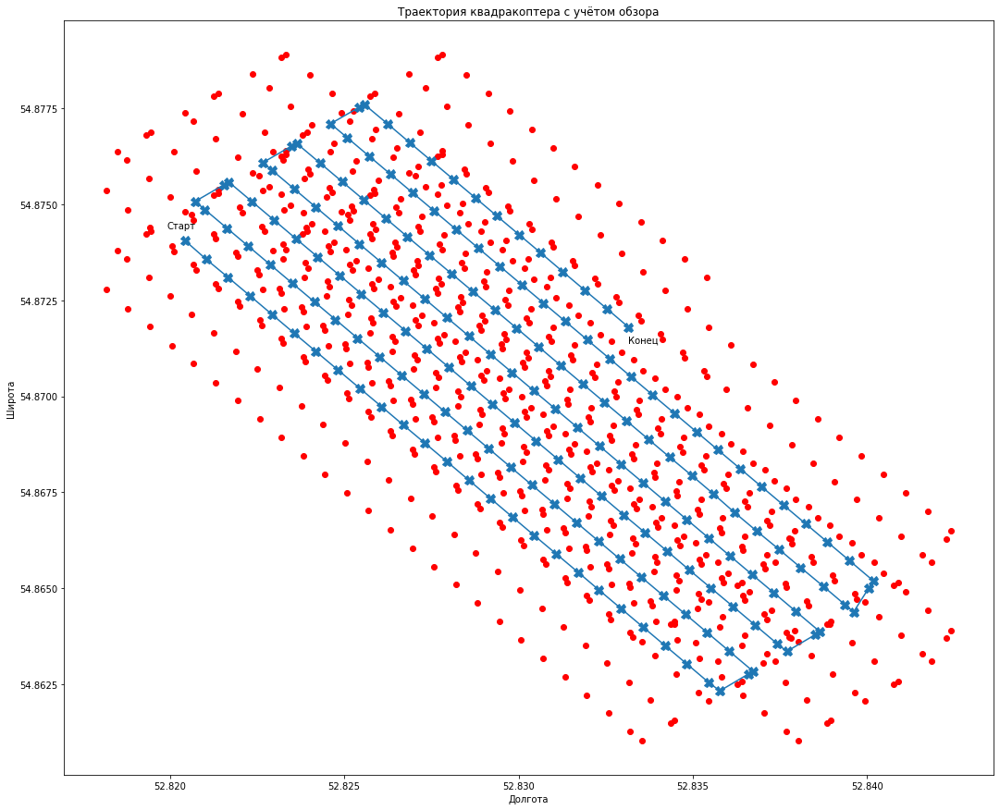

In [ ]:
# Scaling
plt.figure(figsize=(18, 15))

plt.title("Траектория квадракоптера с учётом обзора")
plt.xlabel("Долгота")
plt.ylabel("Широта")

# Make start and end text labels
plt.text(sorted_maps_df.iloc[0].longitude - 0.0005, sorted_maps_df.iloc[0].latitude + 0.0003, "Старт")
plt.text(sorted_maps_df.iloc[-1].longitude, sorted_maps_df.iloc[-1].latitude - 0.0004, "Конец")

# Build traectory
plt.plot(sorted_maps_df["longitude"], sorted_maps_df["latitude"], marker="X", markersize=10)

# Add rect
for i, rectangle in sorted_maps_df[["left_top", "right_top", "left_bottom", "right_bottom"]].iterrows():
  plt.scatter(rectangle.left_top[1], rectangle.left_top[0], color="r")
  plt.scatter(rectangle.right_top[1], rectangle.right_top[0], color="r")
  plt.scatter(rectangle.left_bottom[1], rectangle.left_bottom[0], color="r")
  plt.scatter(rectangle.right_bottom[1], rectangle.right_bottom[0], color="r")

Теперь представим что у нас есть распознаный объект. Он представляет собой bounding box. Нам нужно найти растояние до этого объекта.

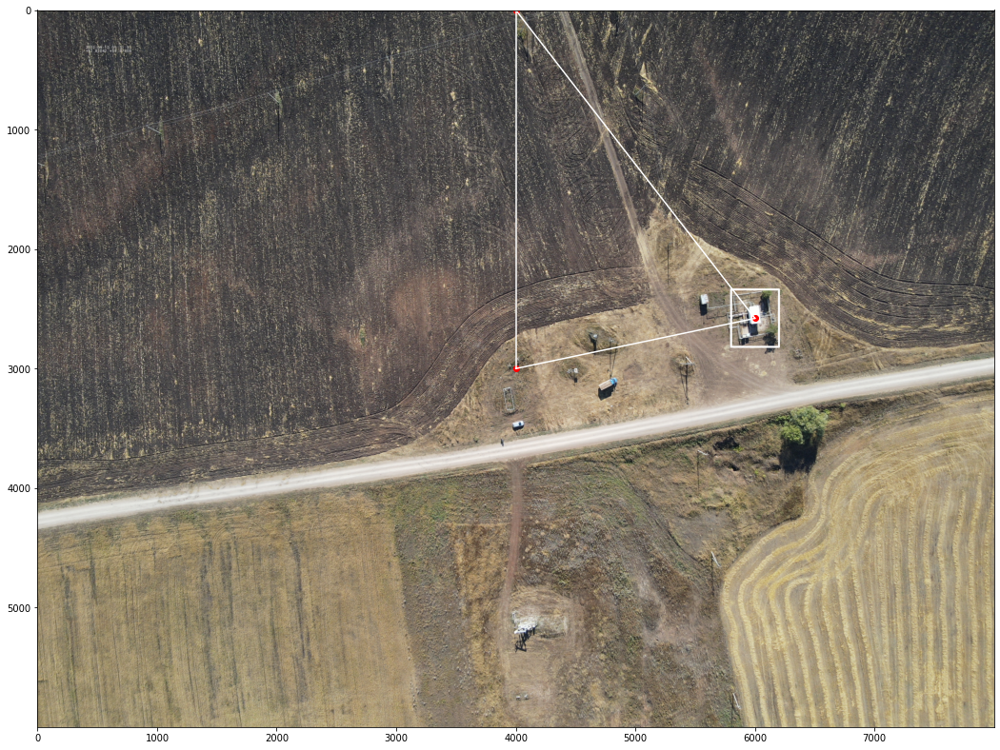

In [ ]:
def draw_bounding_box(img, bb=[], color=(255, 255, 255), thickness=15):
  """
  Функция рисует bounding box 
  Аргументы:
  img - картинка в виде numpy массива
  bb - координаты bounding box в форме вектора. Пример: [центр_x, центр_y, ширина, длина]
  color - цвет в форме вектора. Пример: [r, g, b]
  thickness - толщина обводки
  """
  img_h = img.shape[0]
  img_w = img.shape[1]

  x_center = img_w * bb[0]
  y_center = img_h * bb[1]
  width = img_w * bb[2]
  height = img_h * bb[3]

  return cv2.rectangle(img, (round(x_center - (0.5 * width)), round(y_center - (0.5 * height))), (round(x_center + (0.5 * width)), round(y_center + (0.5 * height))), color, thickness)

# Наш гипотетически распознаный объект
# Значения нормализованны
box = [0.75, 0.43, 0.05, 0.08]

plt.figure(figsize=(18, 15))

# Отобразим изображение с bb
plt.imshow(cv2.cvtColor(
    draw_bounding_box(cv2.imread("/content/images/DJI_0013_W.JPG"), bb=box), cv2.COLOR_BGR2RGB))

# Начертим центральную точку и верхняя серединная
plt.scatter(4000, 3000, c="r")
plt.scatter(4000, 0, c="r")

# Серединная точка распознаного объекта
plt.scatter(box[0] * 8000, box[1] * 6000, c="r")

# Рисуем линии
P1 = [4000, 3000] 
P2 = [box[0] * 8000, box[1] * 6000] 
coords = list(zip(P1, P2))
plt.plot(coords[0], coords[1], c="w")

P1 = [4000, 0] 
P2 = [4000, 3000] 
coords = list(zip(P1, P2))
plt.plot(coords[0], coords[1], c="w")

P1 = [4000, 0] 
P2 = [box[0] * 8000, box[1] * 6000] 
coords = list(zip(P1, P2))
plt.plot(coords[0], coords[1], c="w");

Сначала найдем растояние от центра до центра распознаной точки в пикселях.

In [ ]:
def euclidean_distance(p1, p2):
  p1 = np.array(p1)
  p2 = np.array(p2)
  
  square = np.square(p1 - p2)
  sum_square = np.sum(square)
  return np.sqrt(sum_square)

d = euclidean_distance([4000, 3000], [box[0] * 8000, box[1] * 6000])
d

2043.624231604235

Теперь переведём в метры.

In [ ]:
c = d / pixels_per_metr
c

82.83843662765443

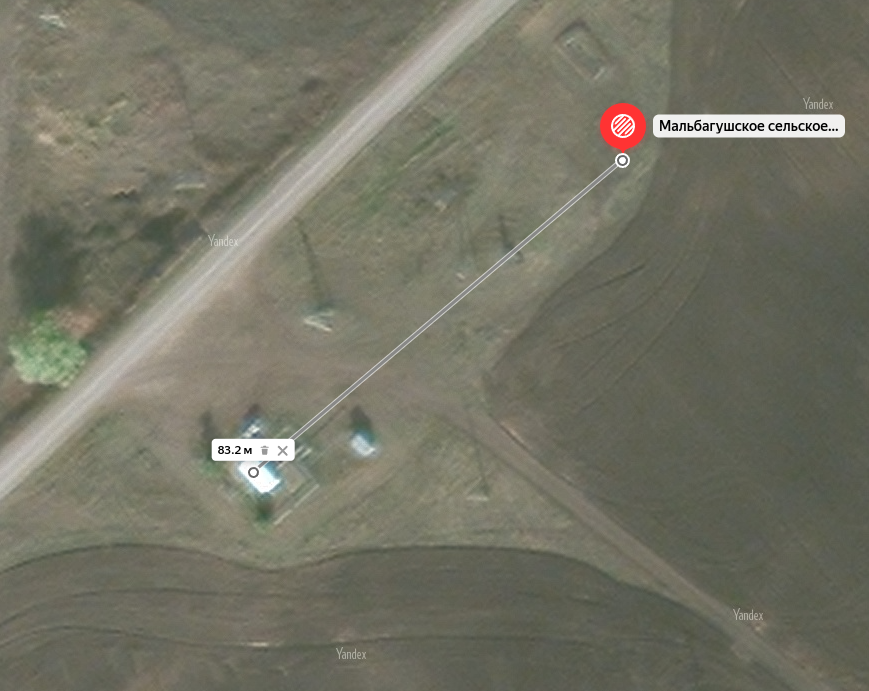

Довольно близко!

Угол наклона относительно севера должен быть определен с компаса дрона (азимут). Теперь нам нужно найти растояние с верхней серединой точки до найденной точки.

In [ ]:
b = euclidean_distance([4000, 0], [box[0] * 8000, box[1] * 6000]) / pixels_per_metr
b

132.32323426861493

Растояние с верхней серединой точки до раснознаной:

In [ ]:
a = img_m_size[1] / 2
a

121.60518848804215

Из теоремы косинусов выведем угол который нам нужен.

In [ ]:
cos_teta = ((a**2) + (c**2) - (b**2)) / (2 * a * c)
cos_teta

0.20551723428641377

Вот мы и нашли угол.

In [ ]:
teta = math.degrees(math.acos(cos_teta))
teta

78.14022087905202

Теперь узнаем азимут. Так как на дроне не было компаса (или был), поэтому скажем азимут примерно 150 градусов.

In [ ]:
azimuth = 150
azimuth

150

Сложим азимут с найденным углом.

In [ ]:
b = azimuth + teta
b

228.14022087905204

In [ ]:
append_distance_to_coordinates(54.874061, 52.82041, b, c/1000)

(54.87356386101462, 52.81944568651378)

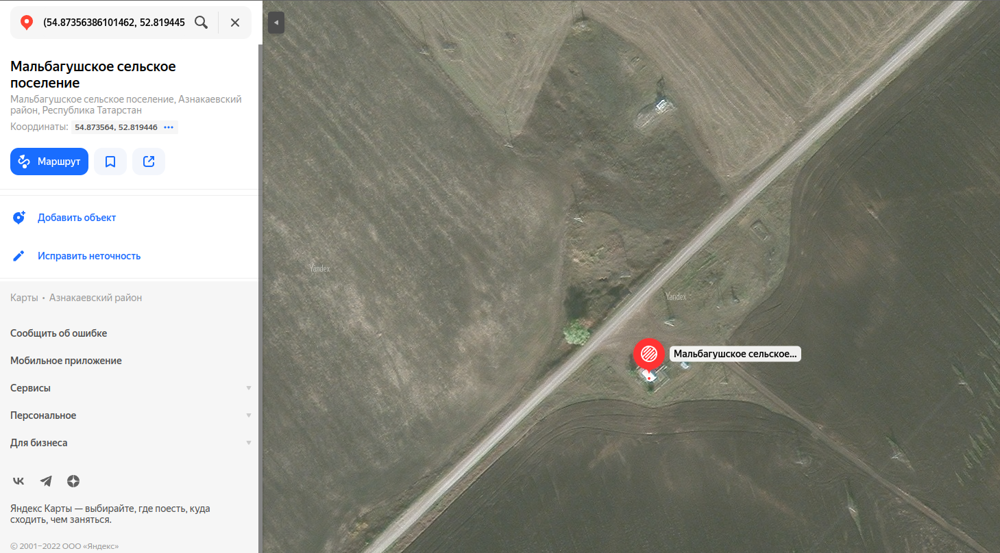

[(54.87356386101462, 52.81944568651378),
 (54.874751633253766, 52.8195999265797)]

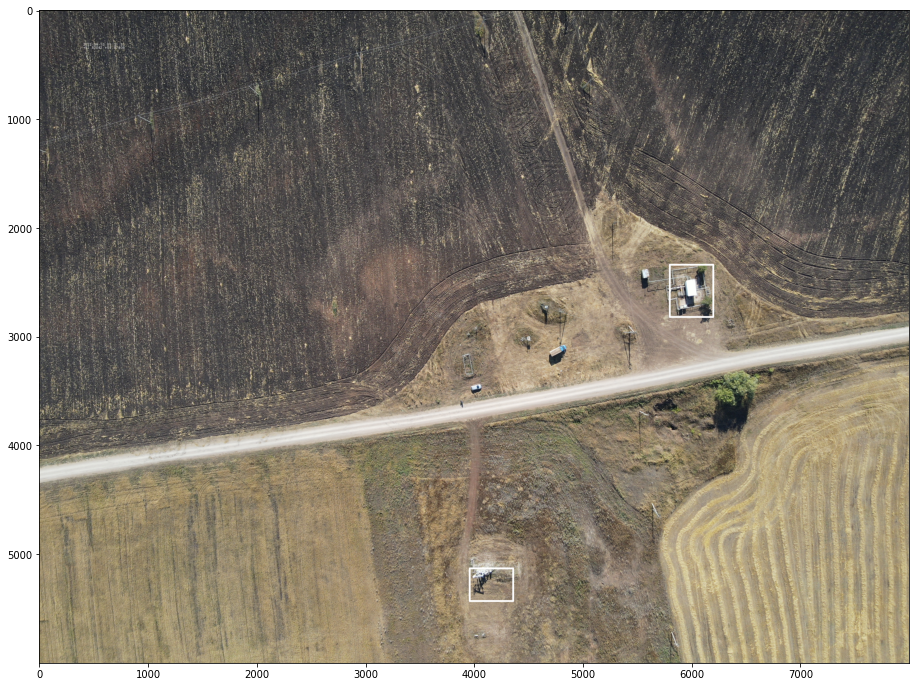

In [ ]:
def get_coordinate_detection_obj(img_row, bb):
  """
  Функция получает dataframe строку и список bounding box-ов. Возвращает координаты цетров bb-ов.
  img_row: строка из dataframe
  bb: список bb
  """
  # Параметры
  azimuth = 150

  plt.figure(figsize=(16, 12))
  coord = []

  img = cv2.cvtColor(cv2.imread(join(dataset_folder, img_row.image_name)), cv2.COLOR_BGR2RGB)

  for box in bb:
    # Между серединой и найденной точкой
    c = euclidean_distance([4000, 3000], [box[0] * 8000, box[1] * 6000]) / pixels_per_metr
    # Между верхнем углом и найденной точкой
    b = euclidean_distance([4000, 0], [box[0] * 8000, box[1] * 6000]) / pixels_per_metr
    # Между серединой и верхним углом (пол изображения в метрах)
    a = img_m_size[1] / 2

    cos_teta = ((a**2) + (c**2) - (b**2)) / (2 * a * c)
    teta = math.degrees(math.acos(cos_teta))
    b = azimuth + teta
    if b > 360:
      b -= 360
    
    coord.append(append_distance_to_coordinates(54.874061, 52.82041, b, c/1000))

    # show bb on image
    img = draw_bounding_box(img, box)

  plt.imshow(img)
  # Подробный вывод
  return coord
coord = get_coordinate_detection_obj(sorted_maps_df.iloc[0], bb=[[0.75, 0.43, 0.05, 0.08], [0.52, 0.88, 0.05, 0.05]])
coord

Покажем их на карте траектории

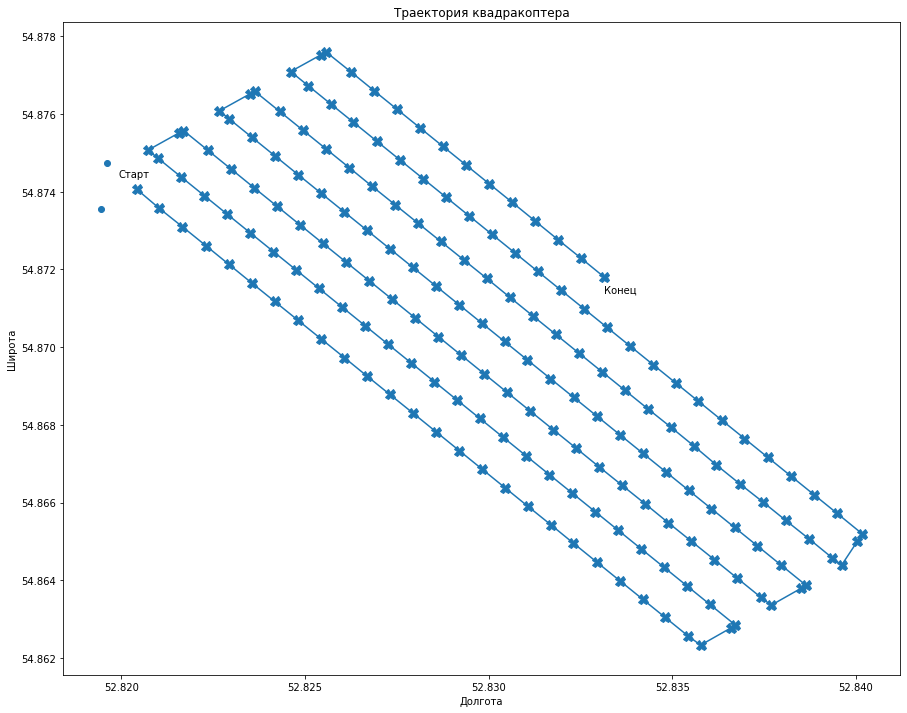

In [ ]:
plt.figure(figsize=(15, 12))
sorted_maps_df = maps_df.sort_values(by="time").reset_index()

plt.title("Траектория квадракоптера")
plt.xlabel("Долгота")
plt.ylabel("Широта")

# Рисуем текст начала и конца
plt.text(sorted_maps_df.iloc[0].longitude - 0.0005, sorted_maps_df.iloc[0].latitude + 0.0003, "Старт")
plt.text(sorted_maps_df.iloc[-1].longitude, sorted_maps_df.iloc[-1].latitude - 0.0004, "Конец")

plt.plot(sorted_maps_df["longitude"], sorted_maps_df["latitude"], marker="X", markersize=10)

coord = np.array(coord)

# Показываем обнаруженные объекты
plt.scatter(coord[:, 1], coord[:, 0]);